# Explore here

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pickle
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import f_classif, SelectKBest
import os
import json
from sklearn.linear_model import LinearRegression

# Cargar los datos desde la URL
pd.set_option('display.max_columns', None)
url = "https://raw.githubusercontent.com/4GeeksAcademy/regularized-linear-regression-project-tutorial/main/demographic_health_data.csv"
total_data = pd.read_csv(url)

# Mostrar las primeras filas del DataFrame
total_data.head()


,fips,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,40-49,40-49 y/o % of total pop,50-59,50-59 y/o % of total pop,60-69,60-69 y/o % of total pop,70-79,70-79 y/o % of total pop,80+,80+ y/o % of total pop,White-alone pop,% White-alone,Black-alone pop,% Black-alone,Native American/American Indian-alone pop,% NA/AI-alone,Asian-alone pop,% Asian-alone,Hawaiian/Pacific Islander-alone pop,% Hawaiian/PI-alone,Two or more races pop,% Two or more races,POP_ESTIMATE_2018,N_POP_CHG_2018,GQ_ESTIMATES_2018,R_birth_2018,R_death_2018,R_NATURAL_INC_2018,R_INTERNATIONAL_MIG_2018,R_DOMESTIC_MIG_2018,R_NET_MIG_2018,Less than a high school diploma 2014-18,High school diploma only 2014-18,Some college or associate's degree 2014-18,Bachelor's degree or higher 2014-18,Percent of adults with less than a high school diploma 2014-18,Percent of adults with a high school diploma only 2014-18,Percent of adults completing some college or associate's degree 2014-18,Percent of adults with a bachelor's degree or higher 2014-18,POVALL_2018,PCTPOVALL_2018,PCTPOV017_2018,PCTPOV517_2018,MEDHHINC_2018,CI90LBINC_2018,CI90UBINC_2018,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,Median_Household_Income_2018,Med_HH_Income_Percent_of_State_Total_2018,Active Physicians per 100000 Population 2018 (AAMC),Total Active Patient Care Physicians per 100000 Population 2018 (AAMC),Active Primary Care Physicians per 100000 Population 2018 (AAMC),Active Patient Care Primary Care Physicians per 100000 Population 2018 (AAMC),Active General Surgeons per 100000 Population 2018 (AAMC),Active Patient Care General Surgeons per 100000 Population 2018 (AAMC),Total nurse practitioners (2019),Total physician assistants (2019),Total Hospitals (2019),Internal Medicine Primary Care (2019),Family Medicine/General Practice Primary Care (2019),Total Specialist Physicians (2019),ICU Beds_x,Total Population,Population Aged 60+,Percent of Population Aged 60+,COUNTY_NAME,STATE_NAME,STATE_FIPS,CNTY_FIPS,county_pop2018_18 and older,anycondition_prevalence,anycondition_Lower 95% CI,anycondition_Upper 95% CI,anycondition_number,Obesity_prevalence,Obesity_Lower 95% CI,Obesity_Upper 95% CI,Obesity_number,Heart disease_prevalence,Heart disease_Lower 95% CI,Heart disease_Upper 95% CI,Heart disease_number,COPD_prevalence,COPD_Lower 95% CI,COPD_Upper 95% CI,COPD_number,diabetes_prevalence,diabetes_Lower 95% CI,diabetes_Upper 95% CI,diabetes_number,CKD_prevalence,CKD_Lower 95% CI,CKD_Upper 95% CI,CKD_number,Urban_rural_code
0,1001,55601,6787,12.206615,7637,13.735364,6878,12.370281,7089,12.749771,7582,13.636445,7738,13.917016,5826,10.478229,4050,7.284042,2014,3.622237,42660,76.725239,10915,19.630942,267,0.480207,681,1.224798,62,0.111509,1016,1.827305,55601,158,455,11.8,9.6,2.2,0.0,0.7,0.6,4204,12119,10552,10291,11.3,32.6,28.4,27.7,7587,13.8,19.3,19.5,59338,53628,65048,25957,25015,942,3.6,59338,119.0,217.1,196.7,77.2,71.2,7.6,6.9,28.859137,6.085786,1.148905,25.992561,21.249061,72.142154,6,55036,10523,19.1,Autauga,Alabama,1,1,42438,47.6,45.4,49.4,20181,35.8,34.2,37.3,15193,7.9,7.2,8.7,3345,8.6,7.3,9.9,3644,12.9,11.9,13.8,5462,3.1,2.9,3.3,1326,3
1,1003,218022,24757,11.355276,26913,12.344167,23579,10.814964,25213,11.564429,27338,12.539102,29986,13.753658,29932,13.728890,20936,9.602701,9368,4.296814,190301,87.285228,19492,8.940382,1684,0.772399,2508,1.150343,146,0.066966,3891,1.784682,218022,5403,2190,10.5,10.3,0.1,0.5,24.3,24.8,14310,40579,46025,46075,9.7,27.6,31.3,31.3,21069,9.8,13.9,13.1,57588,54437,60739,93849,90456,3393,3.6,57588,115.5,217.1,196.7,77.2,71.2,7.6,6.9,113.162114,23.863512,4.505074,101.921730,83.321572,282.882982,51,203360,53519,26.3,Baldwin,Alabama,1,3,170912,40.2,38.2,42.3,68790,29.7,28.4,31.0,50761,7.8,7.0,8.7,13414,8.6,7.2,10.1,14692,12.0,11.0,13.1,20520,3.2,3.0,3.5,5479,4
2,1005,24881,2732,10.980266,2960,11.896628,3268,13.134520,3201,12.865239,3074,12.354809,3278,13.174712,3076,12.3

In [31]:
total_data.shape

(3140, 108)

In [32]:
total_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3140 entries, 0 to 3139
Columns: 108 entries, fips to Urban_rural_code
dtypes: float64(61), int64(45), object(2)
memory usage: 2.6+ MB


In [33]:
total_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3140 entries, 0 to 3139
Columns: 108 entries, fips to Urban_rural_code
dtypes: float64(61), int64(45), object(2)
memory usage: 2.6+ MB


In [34]:
total_data.isnull().sum().sort_values(ascending = False)

fips                      0
TOT_POP                   0
0-9                       0
0-9 y/o % of total pop    0
19-Oct                    0
                         ..
CKD_prevalence            0
CKD_Lower 95% CI          0
CKD_Upper 95% CI          0
CKD_number                0
Urban_rural_code          0
Length: 108, dtype: int64

In [35]:
total_data.isnull().sum().sort_values(ascending = True)

fips                      0
TOT_POP                   0
0-9                       0
0-9 y/o % of total pop    0
19-Oct                    0
                         ..
CKD_prevalence            0
CKD_Lower 95% CI          0
CKD_Upper 95% CI          0
CKD_number                0
Urban_rural_code          0
Length: 108, dtype: int64

In [36]:
total_data.duplicated().sum()



np.int64(0)

In [37]:
total_data.drop(["STATE_FIPS", "fips", "anycondition_Lower 95% CI", "anycondition_Upper 95% CI", "Obesity_Lower 95% CI", "Obesity_Upper 95% CI", "Heart disease_Lower 95% CI", "Heart disease_Upper 95% CI", "COPD_Lower 95% CI", "COPD_Upper 95% CI", "diabetes_Lower 95% CI", "diabetes_Upper 95% CI", "CKD_Lower 95% CI", "CKD_Upper 95% CI", "R_INTERNATIONAL_MIG_2018", "R_DOMESTIC_MIG_2018", "R_NET_MIG_2018"], axis = 1, inplace = True)
total_data.head()

,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,40-49,40-49 y/o % of total pop,50-59,50-59 y/o % of total pop,60-69,60-69 y/o % of total pop,70-79,70-79 y/o % of total pop,80+,80+ y/o % of total pop,White-alone pop,% White-alone,Black-alone pop,% Black-alone,Native American/American Indian-alone pop,% NA/AI-alone,Asian-alone pop,% Asian-alone,Hawaiian/Pacific Islander-alone pop,% Hawaiian/PI-alone,Two or more races pop,% Two or more races,POP_ESTIMATE_2018,N_POP_CHG_2018,GQ_ESTIMATES_2018,R_birth_2018,R_death_2018,R_NATURAL_INC_2018,Less than a high school diploma 2014-18,High school diploma only 2014-18,Some college or associate's degree 2014-18,Bachelor's degree or higher 2014-18,Percent of adults with less than a high school diploma 2014-18,Percent of adults with a high school diploma only 2014-18,Percent of adults completing some college or associate's degree 2014-18,Percent of adults with a bachelor's degree or higher 2014-18,POVALL_2018,PCTPOVALL_2018,PCTPOV017_2018,PCTPOV517_2018,MEDHHINC_2018,CI90LBINC_2018,CI90UBINC_2018,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,Median_Household_Income_2018,Med_HH_Income_Percent_of_State_Total_2018,Active Physicians per 100000 Population 2018 (AAMC),Total Active Patient Care Physicians per 100000 Population 2018 (AAMC),Active Primary Care Physicians per 100000 Population 2018 (AAMC),Active Patient Care Primary Care Physicians per 100000 Population 2018 (AAMC),Active General Surgeons per 100000 Population 2018 (AAMC),Active Patient Care General Surgeons per 100000 Population 2018 (AAMC),Total nurse practitioners (2019),Total physician assistants (2019),Total Hospitals (2019),Internal Medicine Primary Care (2019),Family Medicine/General Practice Primary Care (2019),Total Specialist Physicians (2019),ICU Beds_x,Total Population,Population Aged 60+,Percent of Population Aged 60+,COUNTY_NAME,STATE_NAME,CNTY_FIPS,county_pop2018_18 and older,anycondition_prevalence,anycondition_number,Obesity_prevalence,Obesity_number,Heart disease_prevalence,Heart disease_number,COPD_prevalence,COPD_number,diabetes_prevalence,diabetes_number,CKD_prevalence,CKD_number,Urban_rural_code
0,55601,6787,12.206615,7637,13.735364,6878,12.370281,7089,12.749771,7582,13.636445,7738,13.917016,5826,10.478229,4050,7.284042,2014,3.622237,42660,76.725239,10915,19.630942,267,0.480207,681,1.224798,62,0.111509,1016,1.827305,55601,158,455,11.8,9.6,2.2,4204,12119,10552,10291,11.3,32.6,28.4,27.7,7587,13.8,19.3,19.5,59338,53628,65048,25957,25015,942,3.6,59338,119.0,217.1,196.7,77.2,71.2,7.6,6.9,28.859137,6.085786,1.148905,25.992561,21.249061,72.142154,6,55036,10523,19.1,Autauga,Alabama,1,42438,47.6,20181,35.8,15193,7.9,3345,8.6,3644,12.9,5462,3.1,1326,3
1,218022,24757,11.355276,26913,12.344167,23579,10.814964,25213,11.564429,27338,12.539102,29986,13.753658,29932,13.728890,20936,9.602701,9368,4.296814,190301,87.285228,19492,8.940382,1684,0.772399,2508,1.150343,146,0.066966,3891,1.784682,218022,5403,2190,10.5,10.3,0.1,14310,40579,46025,46075,9.7,27.6,31.3,31.3,21069,9.8,13.9,13.1,57588,54437,60739,93849,90456,3393,3.6,57588,115.5,217.1,196.7,77.2,71.2,7.6,6.9,113.162114,23.863512,4.505074,101.921730,83.321572,282.882982,51,203360,53519,26.3,Baldwin,Alabama,3,170912,40.2,68790,29.7,50761,7.8,13414,8.6,14692,12.0,20520,3.2,5479,4
2,24881,2732,10.980266,2960,11.896628,3268,13.134520,3201,12.865239,3074,12.354809,3278,13.174712,3076,12.362847,2244,9.018930,1048,4.212049,12209,49.069571,12042,48.398376,164,0.659137,113,0.454162,46,0.184880,307,1.233873,24881,-277,2820,10.4,12.9,-2.5,4901,6486,4566,2220,27.0,35.7,25.1,12.2,6788,30.9,43.9,36.7,34382,31157,37607,8373,7940,433,5.2,34382,68.9,217.1,196.7,77.2,71.2,7.6,6.9,12.914231,2.723340,0.514126,11.631462,9.508784,32.283033,5,26201,6150,23.5,Barbour,Alabama,5,19689,57.5,11325,40.7,8013,11.0,2159,12.1,2373,19.7,3870,4.5,887,6
3,22400,2456,10.964286,2596,11.589286,3029,13.5

C:\Users\aguil\AppData\Local\Temp\ipykernel_22232\236784565.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="center", fontsize=10)
C:\Users\aguil\AppData\Local\Temp\ipykernel_22232\236784565.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="center", fontsize=10)
C:\Users\aguil\AppData\Local\Temp\ipykernel_22232\236784565.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="center", fontsize=10)


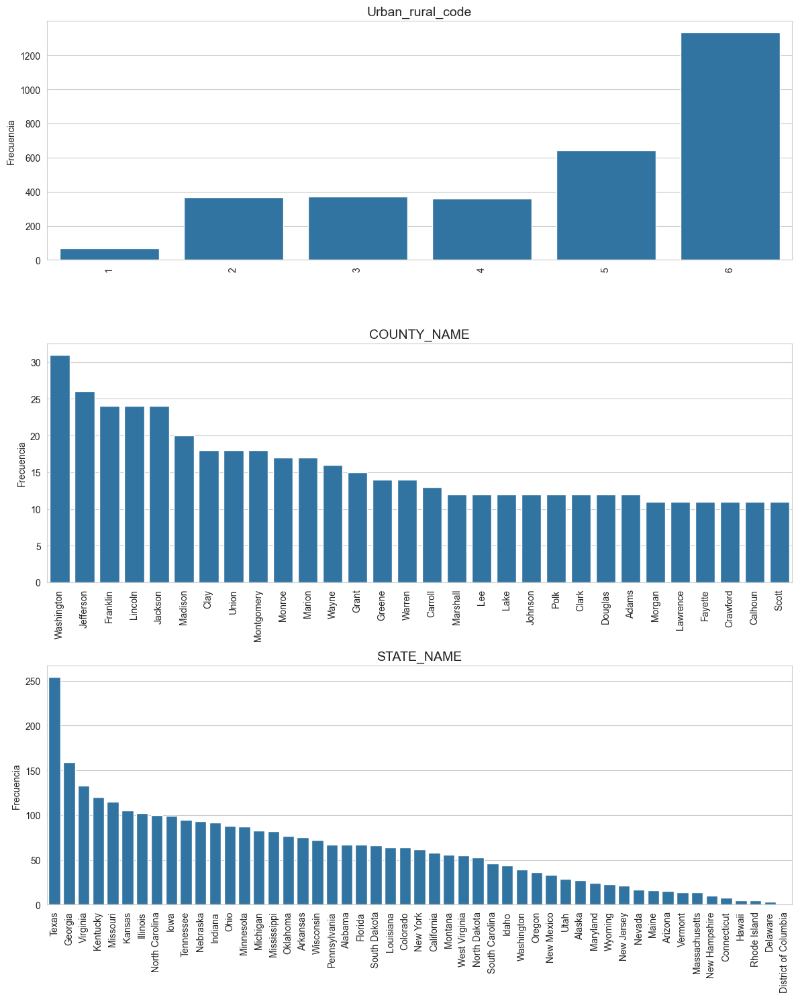

In [38]:
# Lista de columnas categóricas
categorical_variables = ["Urban_rural_code", "COUNTY_NAME", "STATE_NAME"]

# Número de filas
num_rows = len(categorical_variables)

# Ajustar el tamaño de la figura
fig, axes = plt.subplots(num_rows, 1, figsize=(12, 5 * num_rows))

# Asegurar que axes sea iterable cuando hay solo una variable
if num_rows == 1:
    axes = [axes]

for i, column_name in enumerate(categorical_variables):
    ax = axes[i]
    
    # Contar frecuencia de categorías
    category_counts = total_data[column_name].value_counts().sort_values(ascending=False)
    
    # Si hay demasiadas categorías en COUNTY_NAME, mostramos solo las más comunes
    if column_name == "COUNTY_NAME" and len(category_counts) > 30:
        category_counts = category_counts[:30]  # Solo mostramos las 30 más comunes
    
    # Gráfico de barras en lugar de histograma
    sns.barplot(x=category_counts.index, y=category_counts.values, ax=ax)
    
    # Rotar etiquetas a 90 grados en horizontal
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha="center", fontsize=10)

    ax.set_title(column_name, fontsize=14)  # Agregar título con el nombre de la columna
    ax.set_ylabel("Frecuencia")
    ax.set_xlabel("")

plt.tight_layout()
plt.show()

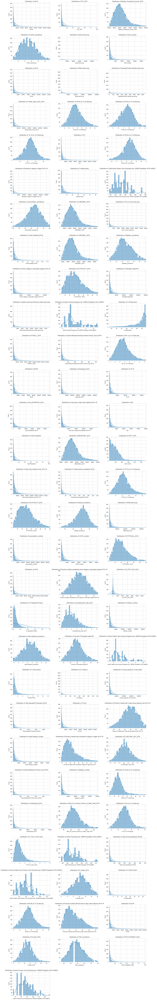

In [39]:
# Lista de variables numéricas
numericals_variables = list(set(total_data.columns) - set(categorical_variables))

# Configurar el número de columnas y calcular filas necesarias
ncols = 3
nrows = int(np.ceil(len(numericals_variables) / ncols))  # Redondear hacia arriba

# Crear la figura con varias columnas
fig, axes = plt.subplots(nrows, ncols, figsize=(20, nrows * 5))

# Convertir `axes` en un array 1D para iterar fácilmente
axes = axes.flatten()

for i, col in enumerate(numericals_variables):
    # Establecer límites automáticos usando percentil 1 y 99 para evitar outliers extremos
    q1, q99 = total_data[col].quantile([0.01, 0.99])

    # Histograma en la parte superior del subplot
    sns.histplot(data=total_data, x=col, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_xlim(q1, q99)  # Aplicar límites para mejorar la visualización

# Eliminar ejes vacíos si hay menos gráficos que subgráficos
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar separación entre gráficos
plt.subplots_adjust(hspace=0.4, wspace=0.3)

plt.show()

C:\Users\aguil\AppData\Local\Temp\ipykernel_22232\777075642.py:15: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


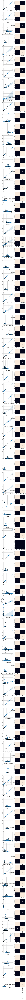

In [40]:
# Crear la variable objetivo
target = total_data["anycondition_number"]
numericals_variables_sin_target = list(set(numericals_variables) - {"target"})

# Crear la figura y los ejes
num_rows = len(numericals_variables_sin_target)
fig, axis = plt.subplots(num_rows, 2, figsize=(10, 5 * num_rows))

# Crear gráficos para cada variable
for i, var in enumerate(numericals_variables_sin_target):
    sns.regplot(ax=axis[i, 0], data=total_data, x=var, y=target, scatter_kws={'edgecolor': 'k', 'alpha': 0.6})
    sns.heatmap(total_data[[target.name, var]].corr(), annot=True, fmt=".2f", ax=axis[i, 1], cbar=False)

# Ajustar el layout
plt.tight_layout()

# Mostrar el plot
plt.show()

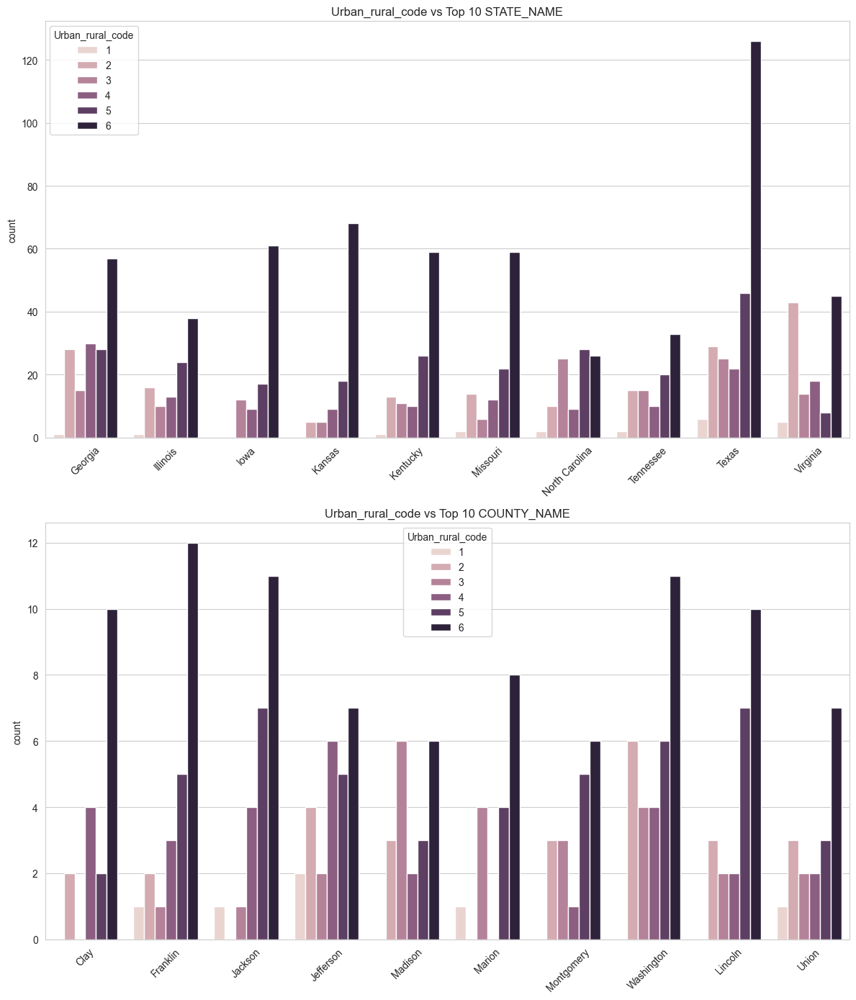

In [41]:
# Filtrar los 10 estados con más datos
top_states = total_data["STATE_NAME"].value_counts().nlargest(10).index
filtered_states = total_data[total_data["STATE_NAME"].isin(top_states)]

# Filtrar los 10 condados más comunes
top_counties = total_data["COUNTY_NAME"].value_counts().nlargest(10).index
filtered_counties = total_data[total_data["COUNTY_NAME"].isin(top_counties)]

fig, axes = plt.subplots(2, 1, figsize=(12, 14))  # Dos gráficos en columna, más grandes

# Urban_rural_code vs. Top 10 STATE_NAME (Barras verticales)
sns.countplot(data=filtered_states, x="STATE_NAME", hue="Urban_rural_code", ax=axes[0])
axes[0].set_title("Urban_rural_code vs Top 10 STATE_NAME")
axes[0].set_xlabel("")
axes[0].tick_params(axis='x', rotation=45)  # Inclina etiquetas para mejor lectura

# Urban_rural_code vs. Top 10 COUNTY_NAME (Barras verticales)
sns.countplot(data=filtered_counties, x="COUNTY_NAME", hue="Urban_rural_code", ax=axes[1])
axes[1].set_title("Urban_rural_code vs Top 10 COUNTY_NAME")
axes[1].set_xlabel("")
axes[1].tick_params(axis='x', rotation=45)  # Inclina etiquetas para mejor lectura

plt.tight_layout()
plt.show()


C:\Users\aguil\AppData\Local\Temp\ipykernel_22232\3659923544.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
C:\Users\aguil\AppData\Local\Temp\ipykernel_22232\3659923544.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
C:\Users\aguil\AppData\Local\Temp\ipykernel_22232\3659923544.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
C:\Users\aguil\AppData\Local\Temp\ipykernel_22232\3659923544.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotat

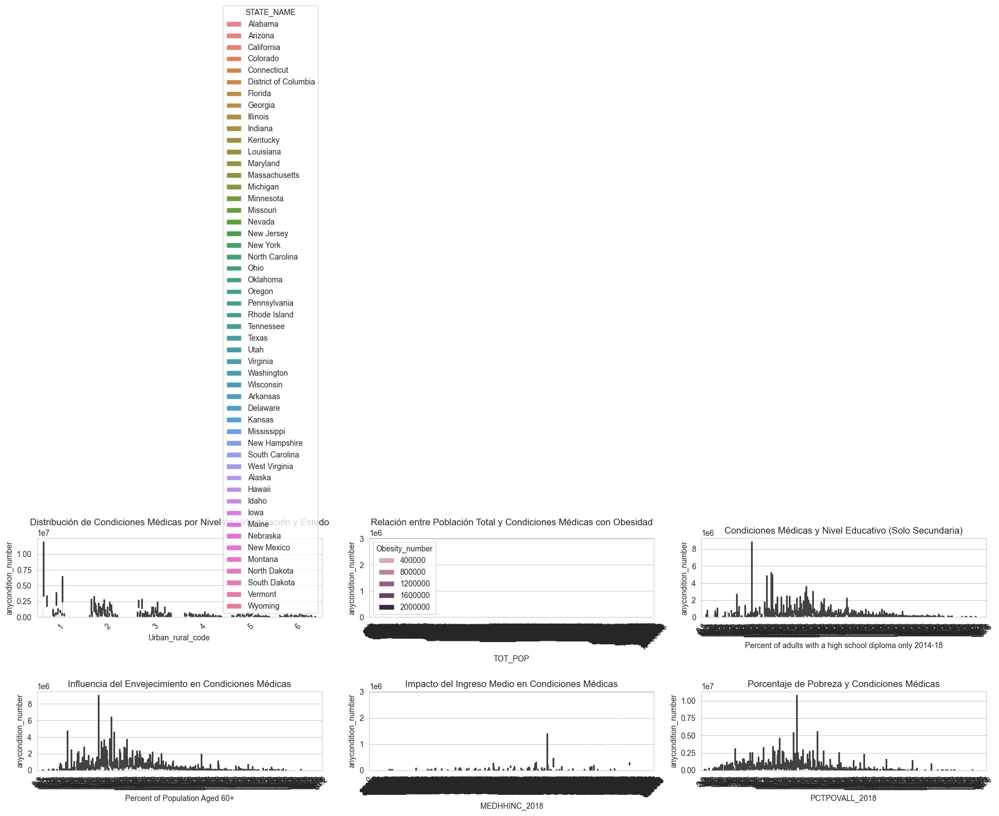

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Gráfico 1: Urbanización vs. Condición médica con hue por estado
sns.barplot(ax=axes[0, 0], data=total_data, x="Urban_rural_code", y="anycondition_number", hue="STATE_NAME", estimator=sum)
axes[0, 0].set_title("Distribución de Condiciones Médicas por Nivel de Urbanización y Estado")

# Gráfico 2: Población total vs. Condiciones médicas con hue por obesidad
sns.barplot(ax=axes[0, 1], data=total_data, x="TOT_POP", y="anycondition_number", hue="Obesity_number", estimator=sum)
axes[0, 1].set_title("Relación entre Población Total y Condiciones Médicas con Obesidad")

# Gráfico 3: Nivel educativo vs. Condiciones médicas
sns.barplot(ax=axes[0, 2], data=total_data, x="Percent of adults with a high school diploma only 2014-18", y="anycondition_number", estimator=sum)
axes[0, 2].set_title("Condiciones Médicas y Nivel Educativo (Solo Secundaria)")

# Gráfico 4: Rango etario 60+ vs. Condiciones médicas
sns.barplot(ax=axes[1, 0], data=total_data, x="Percent of Population Aged 60+", y="anycondition_number", estimator=sum)
axes[1, 0].set_title("Influencia del Envejecimiento en Condiciones Médicas")

# Gráfico 5: Ingreso medio vs. Condiciones médicas
sns.barplot(ax=axes[1, 1], data=total_data, x="MEDHHINC_2018", y="anycondition_number", estimator=sum)
axes[1, 1].set_title("Impacto del Ingreso Medio en Condiciones Médicas")

# Gráfico 6: Pobreza vs. Condiciones médicas
sns.barplot(ax=axes[1, 2], data=total_data, x="PCTPOVALL_2018", y="anycondition_number", estimator=sum)
axes[1, 2].set_title("Porcentaje de Pobreza y Condiciones Médicas")

# Ajustes de diseño
for ax in axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()

In [43]:
#- categoricas --> urban_rural_code, county_name, state_name
total_data["Urban_rural_code_n"], Urban_rural_code_labels = pd.factorize(total_data["Urban_rural_code"])
total_data["COUNTY_NAME_n"], COUNTY_NAME_labels = pd.factorize(total_data["COUNTY_NAME"])
total_data["STATE_NAME_n"], STATE_NAME_labels = pd.factorize(total_data["STATE_NAME"])

# Crear diccionarios de transformación
Urban_rural_code_transformation_rules = {label: idx for idx, label in enumerate(Urban_rural_code_labels)}
COUNTY_NAME_transformation_rules = {label: idx for idx, label in enumerate(COUNTY_NAME_labels)}
STATE_NAME_transformation_rules = {label: idx for idx, label in enumerate(STATE_NAME_labels)}

# Guardar las reglas en archivos JSON
with open("Urban_rural_code_transformation_rules.json", "w") as f:
    json.dump(Urban_rural_code_transformation_rules, f)

with open("COUNTY_NAME_transformation_rules.json", "w") as f:
    json.dump(COUNTY_NAME_transformation_rules, f)

with open("STATE_NAME_transformation_rules.json", "w") as f:
    json.dump(STATE_NAME_transformation_rules, f)

# Mostrar los valores únicos transformados
print("Transformaciones aplicadas y guardadas en JSON.")
print("Urban_rural_code:", Urban_rural_code_transformation_rules)
print("COUNTY_NAME:", COUNTY_NAME_transformation_rules)
print("STATE_NAME:", STATE_NAME_transformation_rules)

Transformaciones aplicadas y guardadas en JSON.
Urban_rural_code: {3: 0, 4: 1, 6: 2, 2: 3, 5: 4, 1: 5}
COUNTY_NAME: {'Autauga': 0, 'Baldwin': 1, 'Barbour': 2, 'Bibb': 3, 'Blount': 4, 'Bullock': 5, 'Butler': 6, 'Calhoun': 7, 'Chambers': 8, 'Cherokee': 9, 'Chilton': 10, 'Choctaw': 11, 'Clarke': 12, 'Clay': 13, 'Cleburne': 14, 'Coffee': 15, 'Colbert': 16, 'Conecuh': 17, 'Coosa': 18, 'Covington': 19, 'Crenshaw': 20, 'Cullman': 21, 'Dale': 22, 'Dallas': 23, 'DeKalb': 24, 'Elmore': 25, 'Escambia': 26, 'Etowah': 27, 'Fayette': 28, 'Franklin': 29, 'Geneva': 30, 'Greene': 31, 'Hale': 32, 'Henry': 33, 'Houston': 34, 'Jackson': 35, 'Jefferson': 36, 'Lamar': 37, 'Lauderdale': 38, 'Lawrence': 39, 'Lee': 40, 'Limestone': 41, 'Lowndes': 42, 'Macon': 43, 'Madison': 44, 'Marengo': 45, 'Marion': 46, 'Marshall': 47, 'Mobile': 48, 'Monroe': 49, 'Montgomery': 50, 'Morgan': 51, 'Perry': 52, 'Pickens': 53, 'Pike': 54, 'Randolph': 55, 'Russell': 56, 'St. Clair': 57, 'Shelby': 58, 'Sumter': 59, 'Talladega': 60

In [44]:
total_data

,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,40-49,40-49 y/o % of total pop,50-59,50-59 y/o % of total pop,60-69,60-69 y/o % of total pop,70-79,70-79 y/o % of total pop,80+,80+ y/o % of total pop,White-alone pop,% White-alone,Black-alone pop,% Black-alone,Native American/American Indian-alone pop,% NA/AI-alone,Asian-alone pop,% Asian-alone,Hawaiian/Pacific Islander-alone pop,% Hawaiian/PI-alone,Two or more races pop,% Two or more races,POP_ESTIMATE_2018,N_POP_CHG_2018,GQ_ESTIMATES_2018,R_birth_2018,R_death_2018,R_NATURAL_INC_2018,Less than a high school diploma 2014-18,High school diploma only 2014-18,Some college or associate's degree 2014-18,Bachelor's degree or higher 2014-18,Percent of adults with less than a high school diploma 2014-18,Percent of adults with a high school diploma only 2014-18,Percent of adults completing some college or associate's degree 2014-18,Percent of adults with a bachelor's degree or higher 2014-18,POVALL_2018,PCTPOVALL_2018,PCTPOV017_2018,PCTPOV517_2018,MEDHHINC_2018,CI90LBINC_2018,CI90UBINC_2018,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,Median_Household_Income_2018,Med_HH_Income_Percent_of_State_Total_2018,Active Physicians per 100000 Population 2018 (AAMC),Total Active Patient Care Physicians per 100000 Population 2018 (AAMC),Active Primary Care Physicians per 100000 Population 2018 (AAMC),Active Patient Care Primary Care Physicians per 100000 Population 2018 (AAMC),Active General Surgeons per 100000 Population 2018 (AAMC),Active Patient Care General Surgeons per 100000 Population 2018 (AAMC),Total nurse practitioners (2019),Total physician assistants (2019),Total Hospitals (2019),Internal Medicine Primary Care (2019),Family Medicine/General Practice Primary Care (2019),Total Specialist Physicians (2019),ICU Beds_x,Total Population,Population Aged 60+,Percent of Population Aged 60+,COUNTY_NAME,STATE_NAME,CNTY_FIPS,county_pop2018_18 and older,anycondition_prevalence,anycondition_number,Obesity_prevalence,Obesity_number,Heart disease_prevalence,Heart disease_number,COPD_prevalence,COPD_number,diabetes_prevalence,diabetes_number,CKD_prevalence,CKD_number,Urban_rural_code,Urban_rural_code_n,COUNTY_NAME_n,STATE_NAME_n
0,55601,6787,12.206615,7637,13.735364,6878,12.370281,7089,12.749771,7582,13.636445,7738,13.917016,5826,10.478229,4050,7.284042,2014,3.622237,42660,76.725239,10915,19.630942,267,0.480207,681,1.224798,62,0.111509,1016,1.827305,55601,158,455,11.8,9.6,2.2,4204,12119,10552,10291,11.3,32.6,28.4,27.7,7587,13.8,19.3,19.5,59338,53628,65048,25957,25015,942,3.6,59338,119.0,217.1,196.7,77.2,71.2,7.6,6.9,28.859137,6.085786,1.148905,25.992561,21.249061,72.142154,6,55036,10523,19.1,Autauga,Alabama,1,42438,47.6,20181,35.8,15193,7.9,3345,8.6,3644,12.9,5462,3.1,1326,3,0,0,0
1,218022,24757,11.355276,26913,12.344167,23579,10.814964,25213,11.564429,27338,12.539102,29986,13.753658,29932,13.728890,20936,9.602701,9368,4.296814,190301,87.285228,19492,8.940382,1684,0.772399,2508,1.150343,146,0.066966,3891,1.784682,218022,5403,2190,10.5,10.3,0.1,14310,40579,46025,46075,9.7,27.6,31.3,31.3,21069,9.8,13.9,13.1,57588,54437,60739,93849,90456,3393,3.6,57588,115.5,217.1,196.7,77.2,71.2,7.6,6.9,113.162114,23.863512,4.505074,101.921730,83.321572,282.882982,51,203360,53519,26.3,Baldwin,Alabama,3,170912,40.2,68790,29.7,50761,7.8,13414,8.6,14692,12.0,20520,3.2,5479,4,1,1,0
2,24881,2732,10.980266,2960,11.896628,3268,13.134520,3201,12.865239,3074,12.354809,3278,13.174712,3076,12.362847,2244,9.018930,1048,4.212049,12209,49.069571,12042,48.398376,164,0.659137,113,0.454162,46,0.184880,307,1.233873,24881,-277,2820,10.4,12.9,-2.5,4901,6486,4566,2220,27.0,35.7,25.1,12.2,6788,30.9,43.9,36.7,34382,31157,37607,8373,7940,433,5.2,34382,68.9,217.1,196.7,77.2,71.2,7.6,6.9,12.914231,2.723340,0.514126,11.631462,9.508784,32.283033,5,26201,6150,23.5,Barbour,Alabama,5,19689,57.5,11325,40.7,8013,11.0,2159,12.1,2373,19.7,3870

In [45]:
numericals_variables = list(set(total_data.columns) - set(categorical_variables))

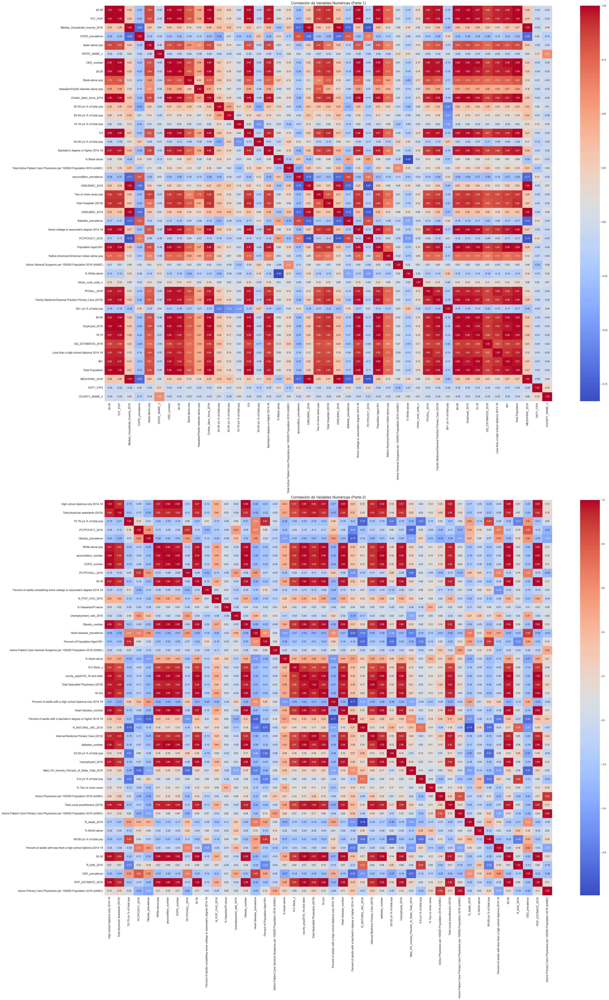

In [46]:
mid_point = len(numericals_variables) // 2
vars_part1 = numericals_variables[:mid_point]
vars_part2 = numericals_variables[mid_point:]

# Crear figura con dos subgráficos
fig, axes = plt.subplots(2, 1, figsize=(40, 60))  # Aumentar significativamente el tamaño de la figura

# Heatmap para la primera parte de las variables
sns.heatmap(
    total_data[vars_part1].corr(),
    annot=True, fmt=".2f", cmap="coolwarm", ax=axes[0],
    annot_kws={"size": 10}  # Ajustar el tamaño del texto
)
axes[0].tick_params(axis='x', labelsize=12, rotation=90)
axes[0].tick_params(axis='y', labelsize=12, rotation=0)
axes[0].set_title("Correlación de Variables Numéricas (Parte 1)", fontsize=16)

# Heatmap para la segunda parte de las variables
sns.heatmap(
    total_data[vars_part2].corr(),
    annot=True, fmt=".2f", cmap="coolwarm", ax=axes[1],
    annot_kws={"size": 10}  # Ajustar el tamaño del texto
)
axes[1].tick_params(axis='x', labelsize=12, rotation=90)
axes[1].tick_params(axis='y', labelsize=12, rotation=0)
axes[1].set_title("Correlación de Variables Numéricas (Parte 2)", fontsize=16)

plt.tight_layout()
plt.show()

In [47]:
corr_matrix = total_data[numericals_variables].corr()

# Identificar las correlaciones más altas
high_correlations = []
for i in range(len(numericals_variables)):
    for j in range(i + 1, len(numericals_variables)):
        if abs(corr_matrix.iloc[i, j]) > 0.7:  # Ajusta el umbral según sea necesario
            high_correlations.append((numericals_variables[i], numericals_variables[j], corr_matrix.iloc[i, j]))

# Calcular el número de filas necesarias
num_graphs = len(high_correlations)
num_cols = 3
num_rows = (num_graphs + num_cols - 1) // num_cols

# Crear la figura con subgráficos
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15 * num_cols, 10 * num_rows))  # Ajustar el tamaño

# Aplanar la matriz de ejes para facilitar la iteración
axes = axes.flatten()

# Representar con regplot en subgráficos
for i, (var1, var2, corr_value) in enumerate(high_correlations):
    sns.regplot(x=var1, y=var2, data=total_data, ax=axes[i])
    axes[i].set_title(f'{var1} vs {var2} (Correlación: {corr_value:.2f})')

# Ocultar los ejes restantes si es necesario
for j in range(num_graphs, num_rows * num_cols):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

ValueError: Image size of 4500x296000 pixels is too large. It must be less than 2^16 in each direction.

Error in callback <function _draw_all_if_interactive at 0x000002A29EF35F80> (for post_execute), with arguments args (),kwargs {}:


ValueError: Image size of 4500x296000 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 4500x296000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 4500x296000 with 887 Axes>

In [ ]:
#sns.pairplot(data = total_data)

In [48]:
total_data.describe()

,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,40-49,40-49 y/o % of total pop,50-59,50-59 y/o % of total pop,60-69,60-69 y/o % of total pop,70-79,70-79 y/o % of total pop,80+,80+ y/o % of total pop,White-alone pop,% White-alone,Black-alone pop,% Black-alone,Native American/American Indian-alone pop,% NA/AI-alone,Asian-alone pop,% Asian-alone,Hawaiian/Pacific Islander-alone pop,% Hawaiian/PI-alone,Two or more races pop,% Two or more races,POP_ESTIMATE_2018,N_POP_CHG_2018,GQ_ESTIMATES_2018,R_birth_2018,R_death_2018,R_NATURAL_INC_2018,Less than a high school diploma 2014-18,High school diploma only 2014-18,Some college or associate's degree 2014-18,Bachelor's degree or higher 2014-18,Percent of adults with less than a high school diploma 2014-18,Percent of adults with a high school diploma only 2014-18,Percent of adults completing some college or associate's degree 2014-18,Percent of adults with a bachelor's degree or higher 2014-18,POVALL_2018,PCTPOVALL_2018,PCTPOV017_2018,PCTPOV517_2018,MEDHHINC_2018,CI90LBINC_2018,CI90UBINC_2018,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,Median_Household_Income_2018,Med_HH_Income_Percent_of_State_Total_2018,Active Physicians per 100000 Population 2018 (AAMC),Total Active Patient Care Physicians per 100000 Population 2018 (AAMC),Active Primary Care Physicians per 100000 Population 2018 (AAMC),Active Patient Care Primary Care Physicians per 100000 Population 2018 (AAMC),Active General Surgeons per 100000 Population 2018 (AAMC),Active Patient Care General Surgeons per 100000 Population 2018 (AAMC),Total nurse practitioners (2019),Total physician assistants (2019),Total Hospitals (2019),Internal Medicine Primary Care (2019),Family Medicine/General Practice Primary Care (2019),Total Specialist Physicians (2019),ICU Beds_x,Total Population,Population Aged 60+,Percent of Population Aged 60+,CNTY_FIPS,county_pop2018_18 and older,anycondition_prevalence,anycondition_number,Obesity_prevalence,Obesity_number,Heart disease_prevalence,Heart disease_number,COPD_prevalence,COPD_number,diabetes_prevalence,diabetes_number,CKD_prevalence,CKD_number,Urban_rural_code,Urban_rural_code_n,COUNTY_NAME_n,STATE_NAME_n
count,3.140000e+03,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3140.000000,3140.000000,3.140000e+03,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3.140000e+03,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3.140000e+03,3.140000e+03,3.140000e+03,3.140000e+03,3140.000000,3140.000000,3140.000000,3140.000000,3.140000e+03,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3.140000e+03,3.140000e+03,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3.140000e+03,3.140000e+03,3140.000000,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3.140000e+03,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000,3140.000000
mean,1.041894e+05,1.274030e+04,11.871051,1.336798e+04,12.694609,1.446933e+04,12.283979,1.391649e+04,11.751535,1.288521e+04,11.556685,1.363803e+04,13.526733,1.191621e+04,13.182225,7220.310510,8.399382,4035.541720,4.733801,7.965979e+04,84.494109,1.395026e+04,9.342405,1320.231210,2.344741,6.155618e+03,1.554548,254.561783,0.141007,2848.954140,2.123190,1.041894e+05,643.424522,2576.335350,11.167739,10.365287,0.802229,8.581987e+03,1.887329e+04,2.017919e+04,2.193144e+04,13.410287,34.285669,30.729777,21.573121,1.332831e+04,15.159459,21.106911,19.882962,52767.083758,48594.546178,56939.6

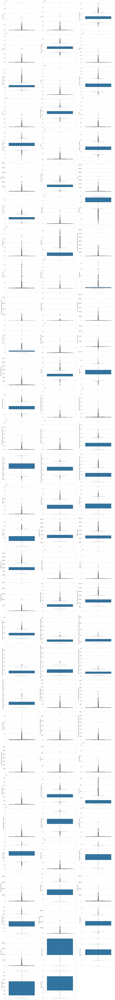

In [49]:
# Obtener las columnas numéricas del DataFrame
columns = total_data.select_dtypes(include=['number']).columns.tolist()

# Crear la figura y los ejes
num_rows = (len(columns) + 2) // 3  # Calcular el número de filas necesarias

#indicar número de columnas que deseas
num_cols = 3

fig, axis = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 5))

# Recorrer las columnas y asignarlas a los ejes
for i, col in enumerate(columns):
    row = i // num_cols  # Calcula la fila
    col_index = i % num_cols  # Calcula el índice de la columna
    sns.boxplot(ax=axis[row, col_index], data=total_data, y=col)

# Eliminar ejes vacíos si los hay
for j in range(len(columns), num_rows * num_cols):
    fig.delaxes(axis.flatten()[j])  # Elimina los ejes vacíos

# Ajustar el diseño
plt.tight_layout()

# Mostrar los gráficos
plt.show()

In [51]:
variables_con_outliers = list(set(numericals_variables) - {"STATE_NAME_n", "COUNTY_NAME_n"})

In [52]:
total_data_con_outliers = total_data.copy()
total_data_sin_outliers = total_data.copy()

def replace_outliers_from_column(column, df):
  column_stats = df[column].describe()
  column_iqr = column_stats["75%"] - column_stats["25%"]
  upper_limit = column_stats["75%"] + 1.5 * column_iqr
  lower_limit = column_stats["25%"] - 1.5 * column_iqr
  if lower_limit < 0:
    lower_limit = min(df[column])
  # Remove upper outliers
  df[column] = df[column].apply(lambda x: x if (x <= upper_limit) else upper_limit)
  # Remove lower outliers
  df[column] = df[column].apply(lambda x: x if (x >= lower_limit) else lower_limit)
  return df.copy(), [lower_limit, upper_limit]

outliers_dict = {}
for column in variables_con_outliers:
  total_data_sin_outliers, limits_list = replace_outliers_from_column(column, total_data_sin_outliers)
  outliers_dict[column] = limits_list

with open("outliers_replacement.json", "w") as f:
   json.dump(outliers_dict, f)
outliers_dict

{'40-49': [4, np.float64(18433.375)],
 'TOT_POP': [88, np.float64(153337.625)],
 'Median_Household_Income_2018': [np.float64(20959.125),
  np.float64(81540.125)],
 'COPD_prevalence': [np.float64(2.3500000000000005),
  np.float64(15.549999999999999)],
 'Asian-alone pop': [0, np.float64(2080.125)],
 'CKD_number': [3, np.float64(3968.5)],
 '20-29': [0, np.float64(20545.0)],
 'Black-alone pop': [0, np.float64(14199.5)],
 'Hawaiian/Pacific Islander-alone pop': [0, np.float64(165.0)],
 'Civilian_labor_force_2018': [0, np.float64(71711.0)],
 '30-39 y/o % of total pop': [np.float64(7.7642376849999994),
  np.float64(15.564463085000002)],
 '40-49 y/o % of total pop': [np.float64(8.133868276249999),
  np.float64(14.937412626250001)],
 '10-19 y/o % of total pop': [np.float64(8.697336139999999),
  np.float64(16.63644994)],
 '0-9': [0, np.float64(18321.75)],
 '50-59 y/o % of total pop': [np.float64(10.202730187500004),
  np.float64(16.964945307499995)],
 "Bachelor's degree or higher 2014-18": [0, np

In [53]:
total_data_con_outliers.isnull().sum().sort_values(ascending=False)

TOT_POP                     0
0-9                         0
0-9 y/o % of total pop      0
19-Oct                      0
10-19 y/o % of total pop    0
                           ..
CKD_number                  0
Urban_rural_code            0
Urban_rural_code_n          0
COUNTY_NAME_n               0
STATE_NAME_n                0
Length: 94, dtype: int64

In [54]:
total_data_sin_outliers.isnull().sum().sort_values(ascending=False)

TOT_POP                     0
0-9                         0
0-9 y/o % of total pop      0
19-Oct                      0
10-19 y/o % of total pop    0
                           ..
CKD_number                  0
Urban_rural_code            0
Urban_rural_code_n          0
COUNTY_NAME_n               0
STATE_NAME_n                0
Length: 94, dtype: int64

In [55]:
### ELEGIR LAS VARIABLES NUMÉRICAS (NO USAR LA TARGET)
num_variables = total_data.select_dtypes(include=['number']).columns.tolist()

# Si deseas filtrar específicamente algunas columnas, puedes hacerlo aquí.
# Por ejemplo, si quieres excluir algunas columnas específicas:
excluded_columns = ["anycondition_number"]  # Coloca aquí cualquier columna que quieras excluir

# Filtrar las columnas excluidas
num_variables = [col for col in num_variables if col not in excluded_columns]

# Dividimos el conjunto de datos en muestras de train y test
X_con_outliers = total_data_con_outliers.drop("anycondition_number", axis = 1)[num_variables]
X_sin_outliers = total_data_sin_outliers.drop("anycondition_number", axis = 1)[num_variables]
y = total_data_con_outliers["anycondition_number"]

X_train_con_outliers, X_test_con_outliers, y_train, y_test = train_test_split(X_con_outliers, y, test_size = 0.2, random_state = 42)
X_train_sin_outliers, X_test_sin_outliers = train_test_split(X_sin_outliers, test_size = 0.2, random_state = 42)

# GUARDAR LOS DATASETS
X_train_con_outliers.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_train_con_outliers.xlsx", index = False)
X_train_sin_outliers.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_train_sin_outliers.xlsx", index = False)
X_test_con_outliers.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_test_con_outliers.xlsx", index = False)
X_test_sin_outliers.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_test_sin_outliers.xlsx", index = False)
y_train.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/y_train.xlsx", index = False)
y_test.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/y_test.xlsx", index = False)

X_train_con_outliers.head()

,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,40-49,40-49 y/o % of total pop,50-59,50-59 y/o % of total pop,60-69,60-69 y/o % of total pop,70-79,70-79 y/o % of total pop,80+,80+ y/o % of total pop,White-alone pop,% White-alone,Black-alone pop,% Black-alone,Native American/American Indian-alone pop,% NA/AI-alone,Asian-alone pop,% Asian-alone,Hawaiian/Pacific Islander-alone pop,% Hawaiian/PI-alone,Two or more races pop,% Two or more races,POP_ESTIMATE_2018,N_POP_CHG_2018,GQ_ESTIMATES_2018,R_birth_2018,R_death_2018,R_NATURAL_INC_2018,Less than a high school diploma 2014-18,High school diploma only 2014-18,Some college or associate's degree 2014-18,Bachelor's degree or higher 2014-18,Percent of adults with less than a high school diploma 2014-18,Percent of adults with a high school diploma only 2014-18,Percent of adults completing some college or associate's degree 2014-18,Percent of adults with a bachelor's degree or higher 2014-18,POVALL_2018,PCTPOVALL_2018,PCTPOV017_2018,PCTPOV517_2018,MEDHHINC_2018,CI90LBINC_2018,CI90UBINC_2018,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,Median_Household_Income_2018,Med_HH_Income_Percent_of_State_Total_2018,Active Physicians per 100000 Population 2018 (AAMC),Total Active Patient Care Physicians per 100000 Population 2018 (AAMC),Active Primary Care Physicians per 100000 Population 2018 (AAMC),Active Patient Care Primary Care Physicians per 100000 Population 2018 (AAMC),Active General Surgeons per 100000 Population 2018 (AAMC),Active Patient Care General Surgeons per 100000 Population 2018 (AAMC),Total nurse practitioners (2019),Total physician assistants (2019),Total Hospitals (2019),Internal Medicine Primary Care (2019),Family Medicine/General Practice Primary Care (2019),Total Specialist Physicians (2019),ICU Beds_x,Total Population,Population Aged 60+,Percent of Population Aged 60+,CNTY_FIPS,county_pop2018_18 and older,anycondition_prevalence,Obesity_prevalence,Obesity_number,Heart disease_prevalence,Heart disease_number,COPD_prevalence,COPD_number,diabetes_prevalence,diabetes_number,CKD_prevalence,CKD_number,Urban_rural_code,Urban_rural_code_n,COUNTY_NAME_n,STATE_NAME_n
1292,26625,3221,12.097653,3463,13.006573,2922,10.974648,2829,10.625352,2831,10.632864,3831,14.388732,3860,14.497653,2460,9.239437,1208,4.537089,25313,95.072300,337,1.265728,428,1.607512,89,0.334272,11,0.041315,447,1.678873,26625,167,303,11.3,10.0,1.3,2546,6396,5727,3406,14.1,35.4,31.7,18.8,4070,15.5,23.3,21.3,50374,47914,52834,12456,11696,760,6.1,50374,88.9,287.0,249.7,97.8,87.6,7.9,6.7,11.773059,10.076354,0.383557,19.750506,16.042791,54.078829,0,26317,7218,27.4,127,20545,49.7,38.6,7930,10.1,2072,11.3,2314,13.7,2823,3.8,771,6,2,879,22
2302,51266,5272,10.283619,5751,11.217961,5137,10.020286,5341,10.418211,5880,11.469590,7885,15.380564,8271,16.133500,4801,9.364881,2928,5.711388,49662,96.871221,593,1.156712,109,0.212617,231,0.450591,22,0.042913,649,1.265946,51266,-557,1302,9.7,13.1,-3.4,3913,18496,9051,6742,10.2,48.4,23.7,17.6,7537,15.0,20.9,18.8,45761,43018,48504,22421,21317,1104,4.9,45761,75.2,320.5,273.3,100.8,88.2,8.7,7.2,28.032647,22.692714,0.796587,41.534592,28.837240,107.146919,8,52880,15253,28.8,121,41304,46.7,33.2,13713,9.2,3796,9.9,4097,13.1,5416,3.5,1454,5,4,1404,38
761,37779,3915,10.362900,5118,13.547209,6202,16.416528,4363,11.548744,4451,11.781678,5107,13.518092,4349,11.511686,2713,7.181238,1561,4.131925,35248,93.300511,1435,3.798407,135,0.357341,394,1.042907,18,0.047646,549,1.453188,37779,169,5022,10.7,9.2,1.5,2678,10860,7263,3984,10.8,43.8,29.3,16.1,3978,12.2,14.8,13.3,54718,50857,58579,16882,16245,637,3.8,54718,98.2,230.8,212.0,80.3,74.4,6.5,6.1,19.493913,4.770448,0.745206,14.853312,18.759998,49.149727,6,37543,8058,21.5,133,30379,47.0,33.7,10238,7.3,2222,9.2,2792,12.2,3698,2.9,871,2,3,327,14
2194,91984,11163,12.135806,12646,13.748043,11595,12.605453,11357,12.346712,11444,12.441294,12774,13.88719

In [56]:
### NORMALIZAMOS EL DATAFRAME CON OUTLIERS Y LO GUARDAMOS
normalizador_con_outliers = StandardScaler()
normalizador_con_outliers.fit(X_train_con_outliers)

with open("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/normalizador_con_outliers.pkl", "wb") as file:
  pickle.dump(normalizador_con_outliers, file)

X_train_con_outliers_norm = normalizador_con_outliers.transform(X_train_con_outliers)
X_train_con_outliers_norm = pd.DataFrame(X_train_con_outliers_norm, index = X_train_con_outliers.index, columns = num_variables)

X_test_con_outliers_norm = normalizador_con_outliers.transform(X_test_con_outliers)
X_test_con_outliers_norm = pd.DataFrame(X_test_con_outliers_norm, index = X_test_con_outliers.index, columns = num_variables)

# GUARDAR LOS DATASETS
X_train_con_outliers_norm.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_train_con_outliers_norm.xlsx", index = False)
X_test_con_outliers_norm.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_test_con_outliers_norm.xlsx", index = False)

### NORMALIZAMOS EL DATAFRAME SIN OUTLIERS Y LO GUARDAMOS
normalizador_sin_outliers = StandardScaler()
normalizador_sin_outliers.fit(X_train_sin_outliers)

with open("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/normalizador_sin_outliers.pkl", "wb") as file:
  pickle.dump(normalizador_sin_outliers, file)

X_train_sin_outliers_norm = normalizador_sin_outliers.transform(X_train_sin_outliers)
X_train_sin_outliers_norm = pd.DataFrame(X_train_sin_outliers_norm, index = X_train_sin_outliers.index, columns = num_variables)

X_test_sin_outliers_norm = normalizador_sin_outliers.transform(X_test_sin_outliers)
X_test_sin_outliers_norm = pd.DataFrame(X_test_sin_outliers_norm, index = X_test_sin_outliers.index, columns = num_variables)

# GUARDAR LOS DATASETS
X_train_sin_outliers_norm.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_train_sin_outliers_norm.xlsx", index = False)
X_test_sin_outliers_norm.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_test_sin_outliers_norm.xlsx", index = False)

In [57]:
### ESCALAMOS EL DATAFRAME CON OUTLIERS Y LO GUARDAMOS
scaler_con_outliers = MinMaxScaler()
scaler_con_outliers.fit(X_train_con_outliers)

with open("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/scaler_con_outliers.pkl", "wb") as file:
  pickle.dump(scaler_con_outliers, file)

X_train_con_outliers_scal = scaler_con_outliers.transform(X_train_con_outliers)
X_train_con_outliers_scal = pd.DataFrame(X_train_con_outliers_scal, index = X_train_con_outliers.index, columns = num_variables)

X_test_con_outliers_scal = scaler_con_outliers.transform(X_test_con_outliers)
X_test_con_outliers_scal = pd.DataFrame(X_test_con_outliers_scal, index = X_test_con_outliers.index, columns = num_variables)

# GUARDAR LOS DATASETS
X_train_con_outliers_scal.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_train_con_outliers_scal.xlsx", index = False)
X_test_con_outliers_scal.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_test_con_outliers_scal.xlsx", index = False)

### ESCALAMOS EL DATAFRAME SIN OUTLIERS Y LO GUARDAMOS
scaler_sin_outliers = MinMaxScaler()
scaler_sin_outliers.fit(X_train_sin_outliers)

with open("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/scaler_sin_outliers.pkl", "wb") as file:
  pickle.dump(scaler_sin_outliers, file)

X_train_sin_outliers_scal = scaler_sin_outliers.transform(X_train_sin_outliers)
X_train_sin_outliers_scal = pd.DataFrame(X_train_sin_outliers_scal, index = X_train_sin_outliers.index, columns = num_variables)

X_test_sin_outliers_scal = scaler_sin_outliers.transform(X_test_sin_outliers)
X_test_sin_outliers_scal = pd.DataFrame(X_test_sin_outliers_scal, index = X_test_sin_outliers.index, columns = num_variables)

# GUARDAR LOS DATASETS
X_train_sin_outliers_scal.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_train_sin_outliers_scal.xlsx", index = False)
X_test_sin_outliers_scal.to_excel("C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels/X_test_sin_outliers_scal.xlsx", index = False)

X_train_con_outliers_scal.head()

,TOT_POP,0-9,0-9 y/o % of total pop,19-Oct,10-19 y/o % of total pop,20-29,20-29 y/o % of total pop,30-39,30-39 y/o % of total pop,40-49,40-49 y/o % of total pop,50-59,50-59 y/o % of total pop,60-69,60-69 y/o % of total pop,70-79,70-79 y/o % of total pop,80+,80+ y/o % of total pop,White-alone pop,% White-alone,Black-alone pop,% Black-alone,Native American/American Indian-alone pop,% NA/AI-alone,Asian-alone pop,% Asian-alone,Hawaiian/Pacific Islander-alone pop,% Hawaiian/PI-alone,Two or more races pop,% Two or more races,POP_ESTIMATE_2018,N_POP_CHG_2018,GQ_ESTIMATES_2018,R_birth_2018,R_death_2018,R_NATURAL_INC_2018,Less than a high school diploma 2014-18,High school diploma only 2014-18,Some college or associate's degree 2014-18,Bachelor's degree or higher 2014-18,Percent of adults with less than a high school diploma 2014-18,Percent of adults with a high school diploma only 2014-18,Percent of adults completing some college or associate's degree 2014-18,Percent of adults with a bachelor's degree or higher 2014-18,POVALL_2018,PCTPOVALL_2018,PCTPOV017_2018,PCTPOV517_2018,MEDHHINC_2018,CI90LBINC_2018,CI90UBINC_2018,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,Median_Household_Income_2018,Med_HH_Income_Percent_of_State_Total_2018,Active Physicians per 100000 Population 2018 (AAMC),Total Active Patient Care Physicians per 100000 Population 2018 (AAMC),Active Primary Care Physicians per 100000 Population 2018 (AAMC),Active Patient Care Primary Care Physicians per 100000 Population 2018 (AAMC),Active General Surgeons per 100000 Population 2018 (AAMC),Active Patient Care General Surgeons per 100000 Population 2018 (AAMC),Total nurse practitioners (2019),Total physician assistants (2019),Total Hospitals (2019),Internal Medicine Primary Care (2019),Family Medicine/General Practice Primary Care (2019),Total Specialist Physicians (2019),ICU Beds_x,Total Population,Population Aged 60+,Percent of Population Aged 60+,CNTY_FIPS,county_pop2018_18 and older,anycondition_prevalence,Obesity_prevalence,Obesity_number,Heart disease_prevalence,Heart disease_number,COPD_prevalence,COPD_number,diabetes_prevalence,diabetes_number,CKD_prevalence,CKD_number,Urban_rural_code,Urban_rural_code_n,COUNTY_NAME_n,STATE_NAME_n
1292,0.002626,0.002666,0.484236,0.002795,0.558117,0.001877,0.316717,0.001876,0.280961,0.002094,0.487737,0.002923,0.577360,0.003786,0.416924,0.004286,0.231025,0.003391,0.199632,0.003536,0.957623,0.000273,0.014706,0.002947,0.017376,0.000057,0.007782,0.000117,0.000846,0.001427,0.065656,0.002626,0.229694,0.001699,0.406475,0.456621,0.372038,0.001740,0.004505,0.003185,0.001564,0.272727,0.574737,0.442266,0.252011,0.002888,0.287037,0.341142,0.320301,0.358835,0.353249,0.364056,0.002425,0.002389,0.003169,0.429577,0.358835,0.337253,0.145951,0.168618,0.186353,0.223350,0.116751,0.166667,0.002983,0.004977,0.004167,0.003449,0.004124,0.003594,0.000000,0.002597,0.003994,0.327239,0.150179,0.002584,0.626697,0.674352,0.003768,0.557522,0.004749,0.475610,0.005315,0.395833,0.002953,0.441860,0.003230,1.0,0.4,0.477693,0.44
2302,0.005064,0.004363,0.411625,0.004641,0.481367,0.003299,0.289175,0.003549,0.268121,0.004352,0.538742,0.006027,0.646467,0.008135,0.491586,0.008375,0.235392,0.008218,0.251301,0.006941,0.976818,0.000480,0.013439,0.000750,0.002298,0.000149,0.010490,0.000234,0.000878,0.002072,0.049507,0.005064,0.222816,0.007301,0.348921,0.598174,0.260664,0.002676,0.013047,0.005041,0.003096,0.190275,0.848421,0.267974,0.235925,0.005349,0.277778,0.306003,0.282707,0.325975,0.317153,0.334220,0.004365,0.004354,0.004603,0.345070,0.325975,0.285281,0.197041,0.221747,0.203555,0.228426,0.157360,0.215686,0.007112,0.011215,0.008671,0.007262,0.007420,0.007129,0.003763,0.005225,0.008457,0.352834,0.143027,0.005206,0.558824,0.518732,0.006525,0.477876,0.008715,0.390244,0.009422,0.364583,0.005676,0.372093,0.006103,0.8,0.8,0.763330,0.76
761,0.003730,0.003240,0.414798,0.004130,0.581316,0.003983,0.473765,0.002898,0.338200,0.003294,0.557766,0.003900,0.516

In [59]:
BASE_PATH = "C:/Users/aguil/OneDrive/Desktop/proyectos javier/REGULARIZED-LINEAR/data/processed/Excels"
TRAIN_PATHS = [
    "X_train_con_outliers.xlsx",
    "X_train_sin_outliers.xlsx",
    "X_train_con_outliers_norm.xlsx",
    "X_train_sin_outliers_norm.xlsx",
    "X_train_con_outliers_scal.xlsx",
    "X_train_sin_outliers_scal.xlsx"
]
TRAIN_DATASETS = []
for path in TRAIN_PATHS:
    TRAIN_DATASETS.append(
        # pd.read_excel(BASE_PATH + "/" + path)
        pd.read_excel(f"{BASE_PATH}/{path}")
        # pd.read_excel(os.path.join(BASE_PATH, path))
    )

TEST_PATHS = [
    "X_test_con_outliers.xlsx",
    "X_test_sin_outliers.xlsx",
    "X_test_con_outliers_norm.xlsx",
    "X_test_sin_outliers_norm.xlsx",
    "X_test_con_outliers_scal.xlsx",
    "X_test_sin_outliers_scal.xlsx"
]
TEST_DATASETS = []
for path in TEST_PATHS:
    TEST_DATASETS.append(
        pd.read_excel(f"{BASE_PATH}/{path}")
    )

y_train = pd.read_excel(f"{BASE_PATH}/y_train.xlsx")
y_test = pd.read_excel(f"{BASE_PATH}/y_test.xlsx")

In [60]:
from sklearn.metrics import mean_squared_error, r2_score

results = []
for index, dataset in enumerate(TRAIN_DATASETS):
    print(f"Entrenando dataset {index}...")

    # Inicializar modelo de regresión
    model = LinearRegression(fit_intercept=True, copy_X=True, n_jobs=None, positive=False)
    
    # Entrenar el modelo
    model.fit(dataset, y_train)
    
    # Predicciones
    y_pred_train = model.predict(dataset)
    y_pred_test = model.predict(TEST_DATASETS[index])

    # Calcular métricas de regresión
    train_mse = mean_squared_error(y_train, y_pred_train)
    test_mse = mean_squared_error(y_test, y_pred_test)
    train_r2 = r2_score(y_train, y_pred_train)
    test_r2 = r2_score(y_test, y_pred_test)

    # Guardar resultados
    results.append(
        {
            "train_mse": train_mse,
            "test_mse": test_mse,
            "train_r2": train_r2,
            "test_r2": test_r2
        }
    )

# Mostrar resultados
results

Entrenando dataset 0...
Entrenando dataset 1...
Entrenando dataset 2...
Entrenando dataset 3...
Entrenando dataset 4...
Entrenando dataset 5...


[{'train_mse': 3282858.3584169,
  'test_mse': 4721791.075691406,
  'train_r2': 0.9997093648861551,
  'test_r2': 0.9987077858524684},
 {'train_mse': 4968885304.812715,
  'test_mse': 1852187940.6916158,
  'train_r2': 0.5600990391364807,
  'test_r2': 0.4931111049849627},
 {'train_mse': 3280761.7116737813,
  'test_mse': 4741765.34588739,
  'train_r2': 0.999709550504631,
  'test_r2': 0.9987023194872439},
 {'train_mse': 4968885304.812713,
  'test_mse': 1852187940.6926577,
  'train_r2': 0.5600990391364808,
  'test_r2': 0.4931111049846775},
 {'train_mse': 3280761.7380848518,
  'test_mse': 4741765.3219374055,
  'train_r2': 0.9997095505022927,
  'test_r2': 0.9987023194937983},
 {'train_mse': 4968885304.812714,
  'test_mse': 1852187940.6926386,
  'train_r2': 0.5600990391364808,
  'test_r2': 0.4931111049846827}]

In [61]:
df_results = pd.DataFrame(results)

# Calcular RMSE
df_results["train_rmse"] = np.sqrt(df_results["train_mse"])
df_results["test_rmse"] = np.sqrt(df_results["test_mse"])

# Seleccionar columnas relevantes para mostrar en tabla
df_results = df_results[["train_rmse", "test_rmse", "train_r2", "test_r2"]]

# Mostrar tabla
print(df_results)

     train_rmse     test_rmse  train_r2   test_r2
0   1811.865988   2172.968264  0.999709  0.998708
1  70490.320646  43037.053113  0.560099  0.493111
2   1811.287308   2177.559493  0.999710  0.998702
3  70490.320646  43037.053113  0.560099  0.493111
4   1811.287315   2177.559488  0.999710  0.998702
5  70490.320646  43037.053113  0.560099  0.493111
